# Activation Maximization (AM)

Activation maximization is an explainability technique that generates synthetic input samples to maximize (or minimize) the output of a neural network model. By optimizing the input to strongly activate a particular neuron or output, we can gain insights into what patterns or features the model has learned to associate with high or low predictions.

Here we examine how the by-cell-lines activization maximizations (with input features pertaining to cell lines fixes and all others learned by AM)  differ from each other and the genral "prototypical AM output".
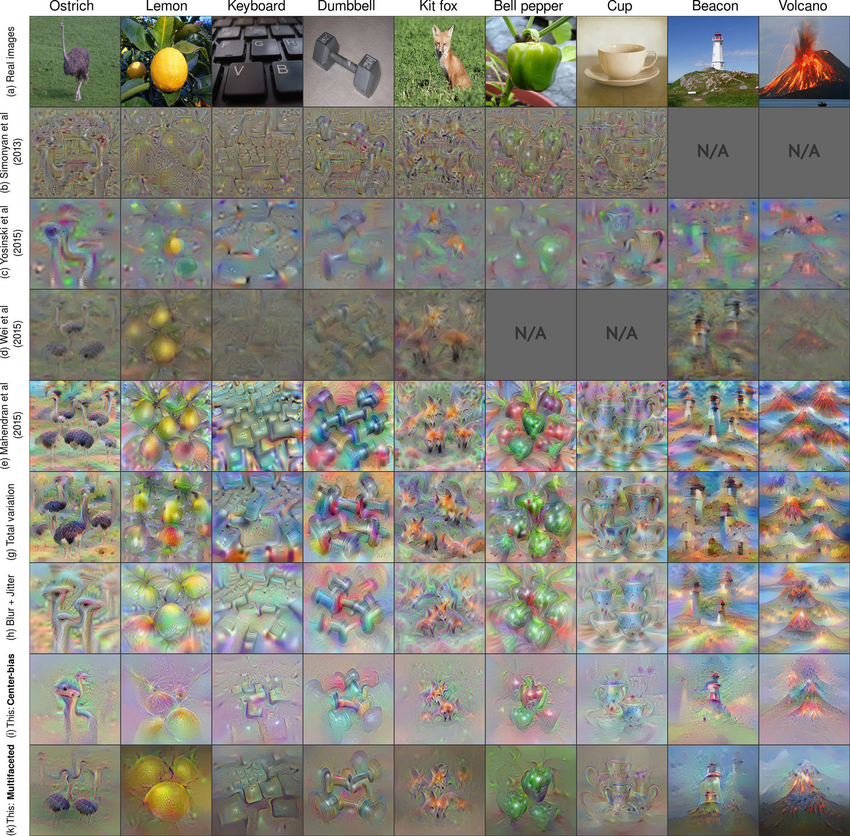

Since it is very important to NOT have the input (which is the output) of AM be on an edge of a manifold - we do regularize one variant (with L2) to the input distribution by using the mean of the distribution and penalising staying to far away from the z-score space of the input data (X).

In [1]:
import sys
from pathlib import Path
import os 

# Assuming this notebook is in: explainability/notebooks/
# So we go two levels up to reach the root where 'explainability/' lives
project_root = Path.cwd().parents[1]  # cwd = explainability/notebooks/
# join paths -> project root /explainability
explainability_path = project_root / "explainability"


sys.path.append(str(explainability_path))
os.chdir(project_root)

In [2]:
import os
os.getcwd()

'c:\\Users\\ismyn\\UNI\\FU Berlin\\SWP_Cancer\\Drug-Inhibitor-Cancer-Treatment'

## Models' learned AM features

Let's visualize the optimal gene/protein features outputted by AM, that maximally activat for synergy given fixed features of a cell line.

At the very end of the notebook, you can find a case study tackling findings for selected Cell lines for Biomining and Transynergy respectively.

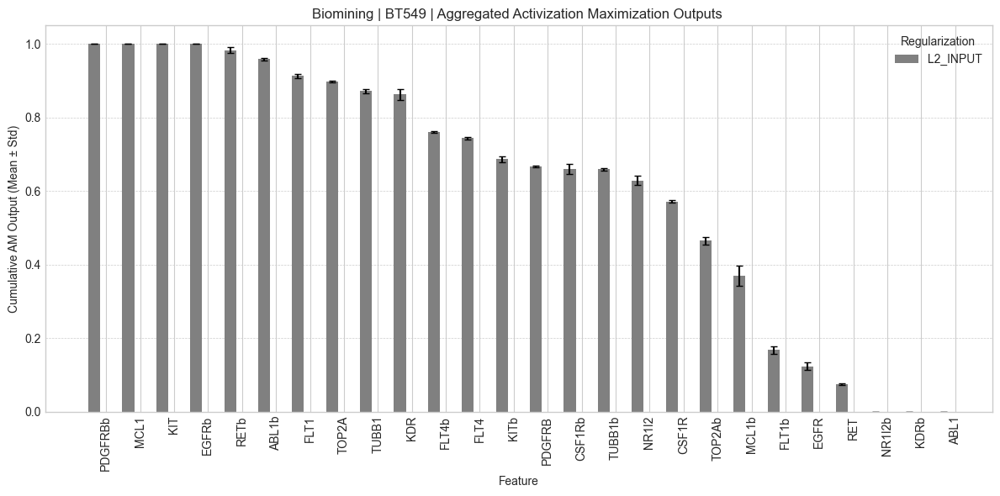

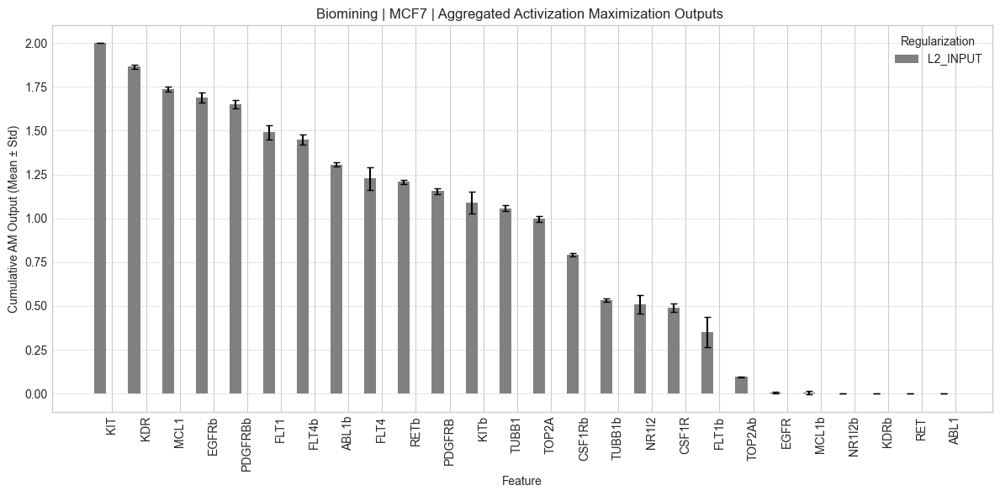

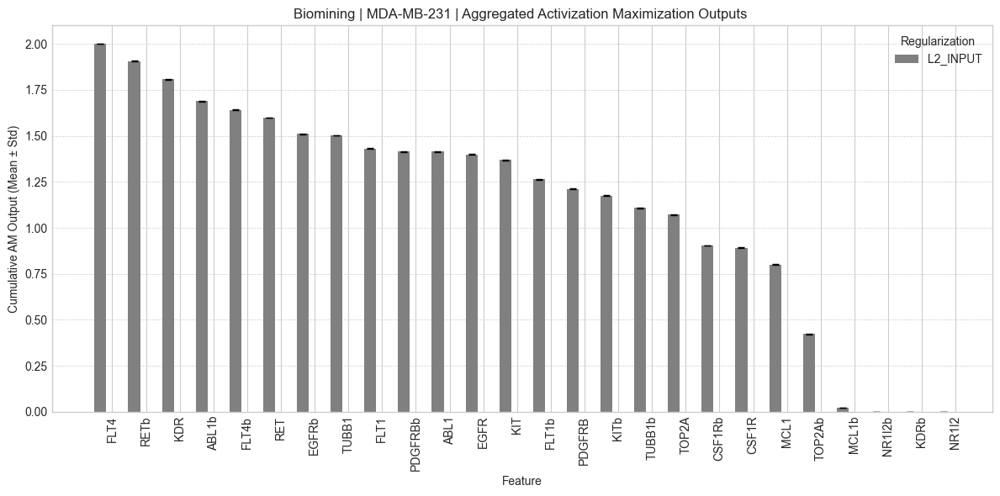

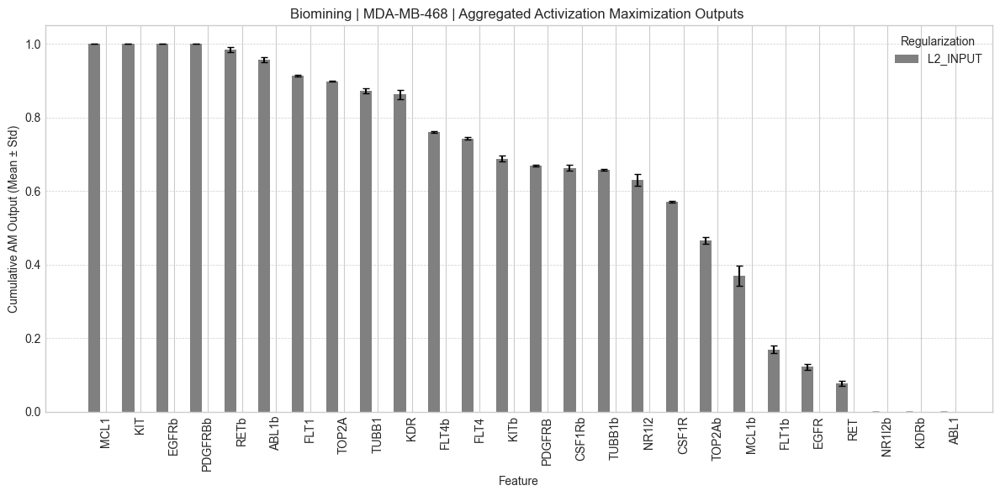

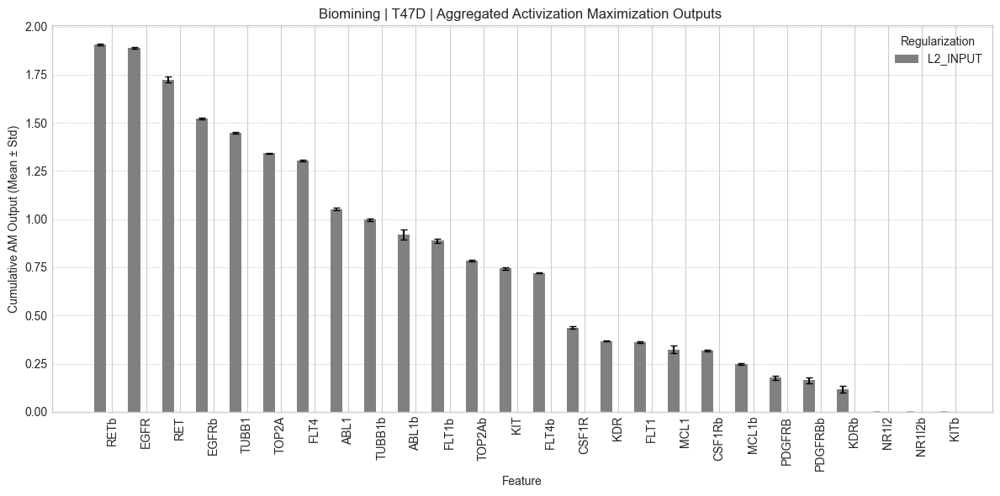

...

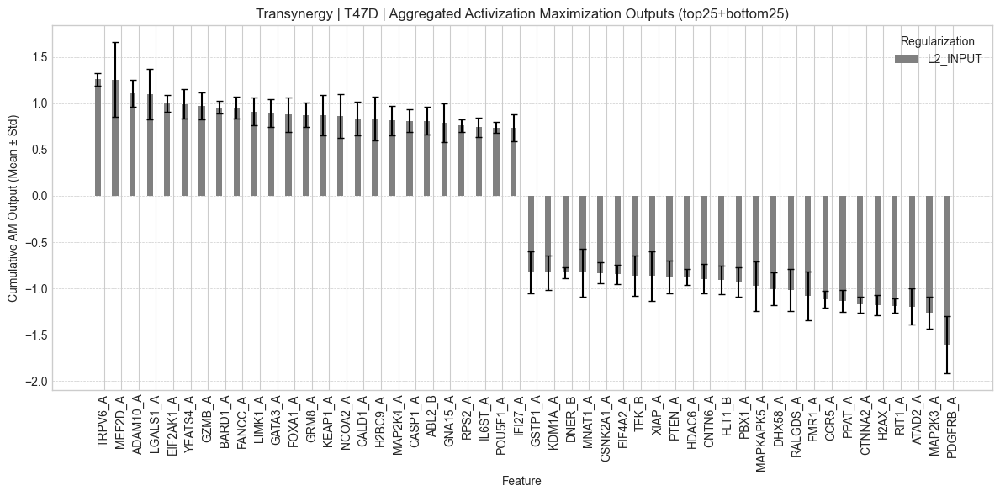

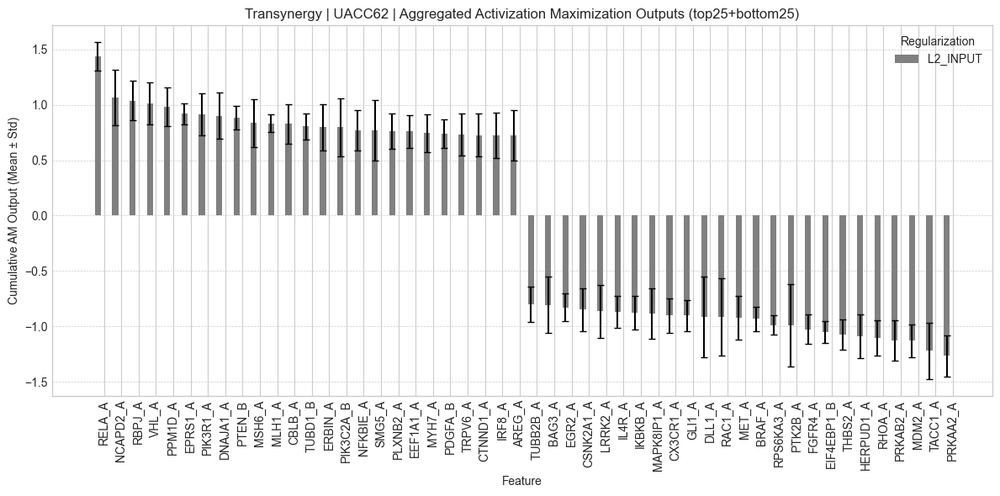

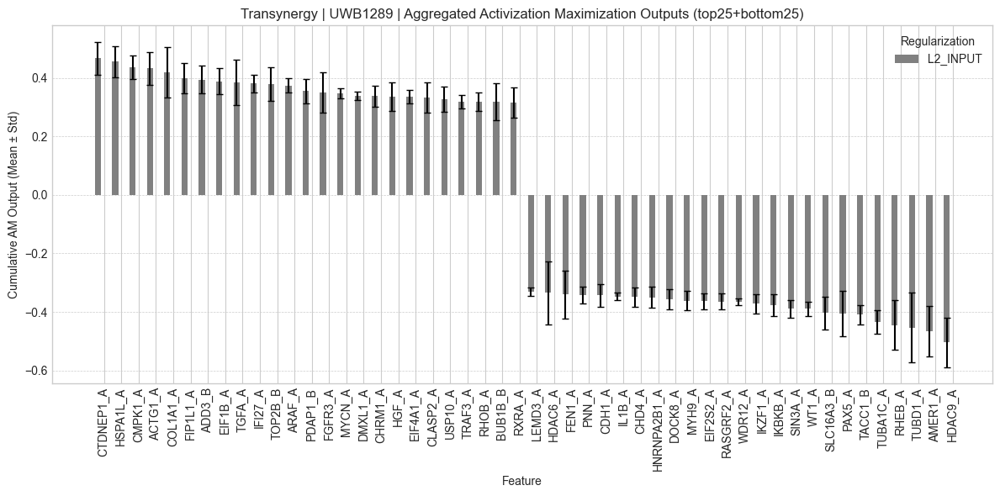

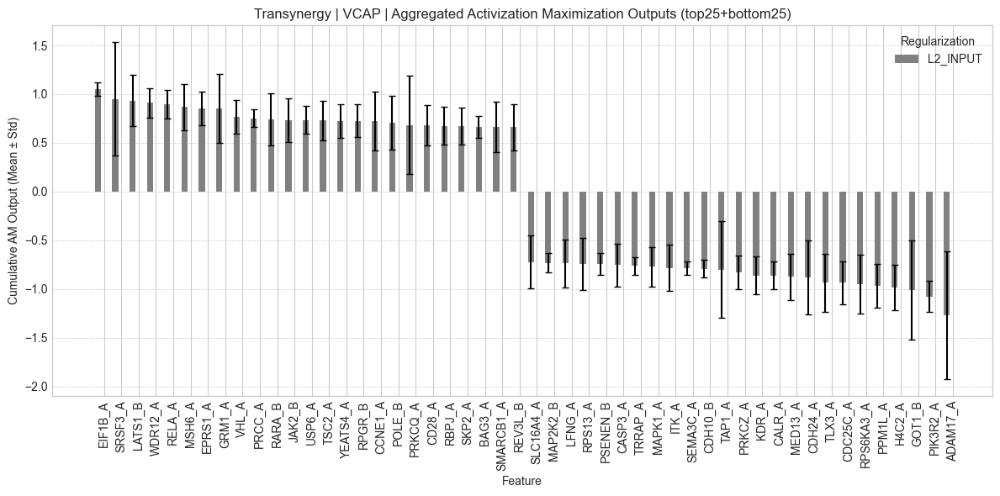

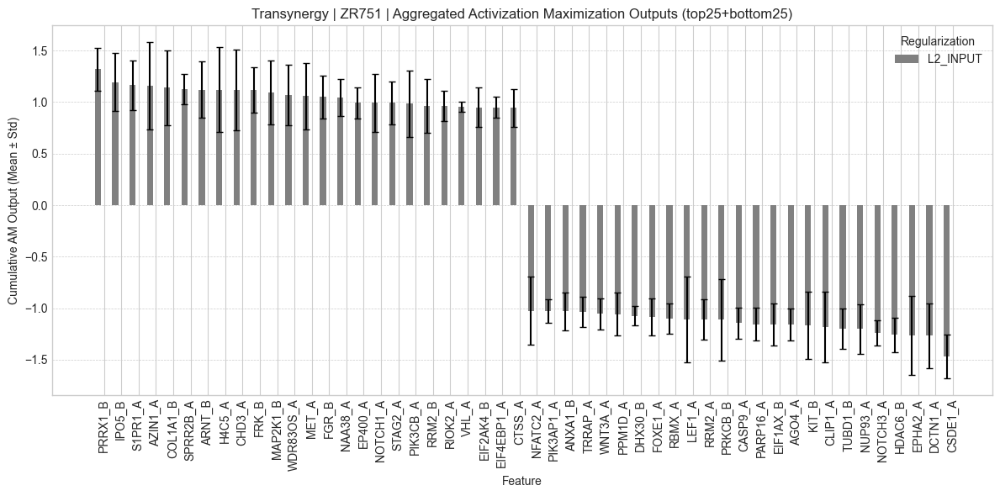

In [3]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from explaination_config import ExplainationConfig

plt.style.use("seaborn-v0_8-whitegrid")

regularizations = ["l2_input"]
colors = {
    "l2_input": "gray"  # changed to gray
}
papers = ["biomining", "transynergy"]
cell_line_names = {
    'biomining': ["BT549", "MCF7", "MDA-MB-231", "MDA-MB-468", "T47D"],
    'transynergy': ["A375", "A427", "A2058", "A2780", "CAOV3", "DLD1", "ES2", "HCT116", "HT29", "HT144",
                    "KPL1", "LOVO", "MDAMB436", "MSTO", "NCIH23", "NCIH460","NCIH520", "NCIH1650",
                    "NCIH2122", "OCUBM", "OV90", "OVCAR3", "PA1", "RKO","RPMI7951",
                    "SKMEL30", "SKMES1", "SKOV3", "SW620", "SW837", "T47D", "UACC62", "UWB1289", "VCAP", "ZR751"]
}
dict_papers_indices_l2 = {}

for paper in papers:
    feature_names = ExplainationConfig(paper=paper).feature_names
    cell_lines = cell_line_names[paper]
    
    for cell_line in cell_lines:
        SORTED_ORDER_INDICES = None
        feature_importance_all_regs = {}
        feature_std_all_regs = {}

        for reg in regularizations:
            path_to_experiment = os.path.join(os.getcwd(), f"explainability/am/results/by_cell_line/{paper}_{cell_line}_max_reg_{reg}")
            tensors = []

            for file in os.listdir(path_to_experiment):
                if file.endswith(".pt"):
                    tensor = torch.load(os.path.join(path_to_experiment, file))
                    tensors.append(tensor.numpy())

            if not tensors:
                continue  # skip if no files

            all_tensor_stack = np.stack(tensors)
            mean_importance = all_tensor_stack.mean(axis=0)
            std_importance = all_tensor_stack.std(axis=0)

            feature_importance_all_regs[reg] = mean_importance.tolist()
            feature_std_all_regs[reg] = std_importance.tolist()

            index_max = 4804 if paper == 'transynergy' else 26

            if SORTED_ORDER_INDICES is None:
                full_sorted_indices = np.argsort(-mean_importance)  # descending
                full_sorted_indices = [i for i in full_sorted_indices if i < index_max]
                dict_papers_indices_l2[(paper, cell_line)] = full_sorted_indices

                if len(feature_names) > 50:
                    top_25 = full_sorted_indices[:25]
                    bottom_25 = full_sorted_indices[-25:]
                    SORTED_ORDER_INDICES = top_25 + bottom_25
                else:
                    SORTED_ORDER_INDICES = full_sorted_indices

        if not SORTED_ORDER_INDICES:
            continue  # skip cell line if empty

        sorted_feature_names = [feature_names[i] for i in SORTED_ORDER_INDICES]

        plt.figure(figsize=(12, 6))
        bar_width = 0.35
        x = np.arange(len(SORTED_ORDER_INDICES))

        for idx, reg in enumerate(regularizations):
            sorted_means = [feature_importance_all_regs[reg][i] for i in SORTED_ORDER_INDICES]
            sorted_stds = [feature_std_all_regs[reg][i] for i in SORTED_ORDER_INDICES]
            offset = x + (idx - 1) * bar_width

            plt.bar(offset, sorted_means, width=bar_width, yerr=sorted_stds,
                    label=reg.upper(), color=colors[reg], capsize=3)

        suffix = "(top25+bottom25)" if len(feature_names) > 50 else ""
        plt.xticks(x, sorted_feature_names, rotation=90)
        plt.title(f"{paper.capitalize()} | {cell_line.upper()} | Aggregated Activization Maximization Outputs {suffix}")
        plt.xlabel("Feature")
        plt.ylabel("Cumulative AM Output (Mean ± Std)")
        plt.legend(title="Regularization")
        plt.tight_layout()
        plt.grid(axis='y', linestyle='--', linewidth=0.5)
        plt.show()


Below, some overview plots for both Biomining and Transynergy.

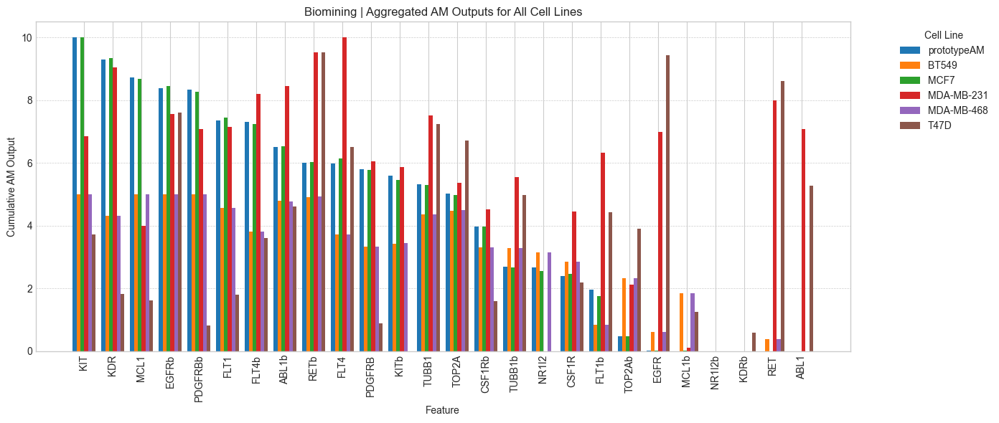

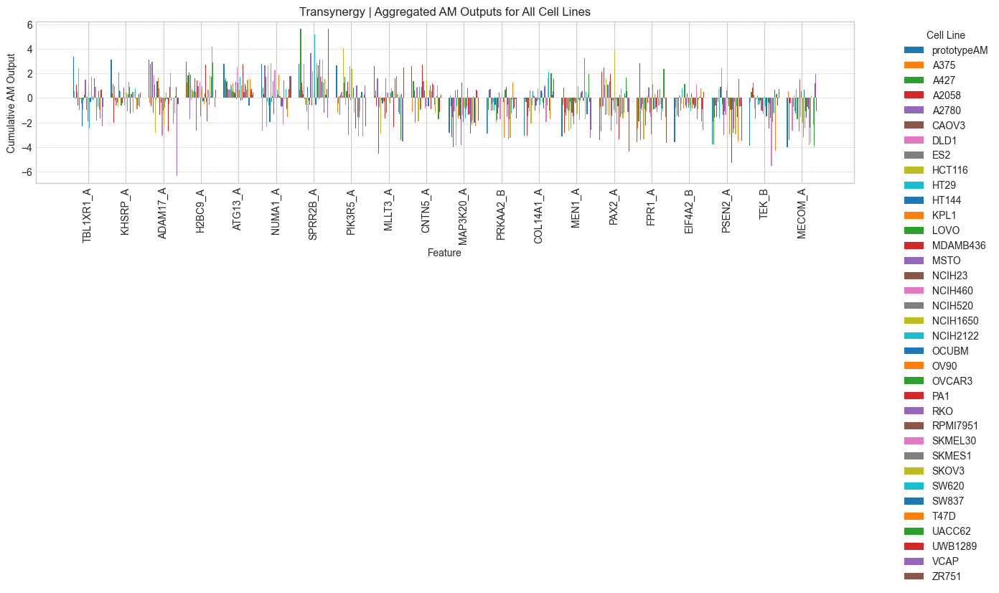

In [4]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from explaination_config import ExplainationConfig

plt.style.use("seaborn-v0_8-whitegrid")

regularizations = ["l2_input"]
colors = {
    "l2_input": "#F2A900"  # orange
}
papers = ["biomining", "transynergy"]
cell_line_names = {
    'biomining': ["prototypeAM", "BT549", "MCF7", "MDA-MB-231", "MDA-MB-468", "T47D"],
    'transynergy': ["prototypeAM", "A375", "A427", "A2058", "A2780", "CAOV3", "DLD1", "ES2", "HCT116", "HT29", "HT144",
                    "KPL1", "LOVO", "MDAMB436", "MSTO", "NCIH23",
                    "NCIH460","NCIH520", "NCIH1650", "NCIH2122", "OCUBM", "OV90", "OVCAR3", "PA1", "RKO","RPMI7951",
                    "SKMEL30", "SKMES1", "SKOV3", "SW620", "SW837", "T47D", "UACC62", "UWB1289", "VCAP", "ZR751"]
}



index_max_by_paper = {'biomining': 26, 'transynergy': 4804}
for paper in papers:
    sorted_indices = None
    feature_names = ExplainationConfig(paper=paper).feature_names
    cell_lines = cell_line_names[paper]
    index_max = index_max_by_paper[paper]
    feature_importance_per_cell_line = {}

    # Collect importance per cell line
    for cell_line in cell_lines:
        if cell_line == 'prototypeAM':
            path_to_experiment = os.path.join(
            os.getcwd(), f"explainability/am/results/{paper}_max_reg_l2_input"
        )
        else:
            path_to_experiment = os.path.join(
            os.getcwd(), f"explainability/am/results/by_cell_line/{paper}_{cell_line}_max_reg_l2_input"
        )
        feature_importance = torch.zeros(len(feature_names))
        for file in os.listdir(path_to_experiment):
            if file.endswith(".pt"):
                tensor = torch.load(os.path.join(path_to_experiment, file))
                feature_importance += tensor

        importance_array = feature_importance.numpy() 
        # make sure to sort by prototypeAM and not anything else - also making the index match!
        
        prototype_array = feature_importance.numpy()
        
        if cell_line == 'prototypeAM':
            sorted_indices = np.argsort(-prototype_array)
            sorted_indices = [i for i in sorted_indices if i < index_max]
        
        if len(feature_names) > 50:
            top_10 = sorted_indices[:10]
            bottom_10 = sorted_indices[-10:]
            final_indices = top_10 + bottom_10
        else:
            final_indices = sorted_indices

        feature_importance_per_cell_line[cell_line] = [importance_array[i] for i in final_indices]

    # Plot for one paper (all cell lines)
    #TODO: group by cell line by cancer type!
    plt.figure(figsize=(14, 6))
    x = np.arange(len(final_indices))
    bar_width = 0.8 / len(cell_lines)

    for idx, cell_line in enumerate(cell_lines):
        offset = x + (idx - len(cell_lines) / 2) * bar_width + bar_width / 2
        plt.bar(offset,
                feature_importance_per_cell_line[cell_line],
                width=bar_width,
                label=cell_line)

    sorted_feature_names = [feature_names[i] for i in final_indices]
    plt.xticks(x, sorted_feature_names, rotation=90)
    plt.title(f"{paper.capitalize()} | Aggregated AM Outputs for All Cell Lines")
    plt.xlabel("Feature")
    plt.ylabel("Cumulative AM Output")
    plt.legend(title="Cell Line", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.grid(axis='y', linestyle='--', linewidth=0.5)
    plt.show()


## How much do by-cell line AM results differ from the global Prototype?

We previously performed AM globally - trying to find an input vector optimizing both cell line and gene features in the input - this global prototype maximally activates the model predicting high synergy. How do the learned by-cell-line fetures differ from the global prototype? 

In [5]:
transynergy_clusters = {
    "melanoma": [
        "A375",      # skin malignant melanoma :contentReference[oaicite:1]{index=1}
        "A2058",     # melanoma
        "HT144",     # melanoma
        "RPMI7951",  # melanoma
        "SKMEL30",
        "UACC62"
    ],
    "ovarian_cancer": [
        "A2780",
        "CAOV3",
        "ES2",
        "OV90",
        "OVCAR3",    # ovarian adenocarcinoma :contentReference[oaicite:2]{index=2}
        "PA1",
        "SKOV3",
        "UWB1289"
    ],
    "colorectal_cancer": [
        "DLD1",
        "HCT116",
        "HT29",
        "LOVO",
        "RKO",
        "SW620",
        "SW837"
    ],
    "lung_cancer": [
        "A427",
        "NCIH23",
        "NCIH460",   # large cell lung carcinoma :contentReference[oaicite:3]{index=3}
        "NCIH520",
        "NCIH1650",
        "NCIH2122",
        "SKMES1",
    ],
    "breast_cancer": [
        "MDAMB436",
        "T47D",
        "OCUBM",
        'KPL1',
        "ZR751"
    ],
    "mesothelioma": [
        "MSTO"       # biphasic mesothelioma :contentReference[oaicite:4]{index=4}
    ],
    "prostate_cancer": [
        "VCAP"
    ],
    "prototype": [
        "prototypeAM"
    ]
}


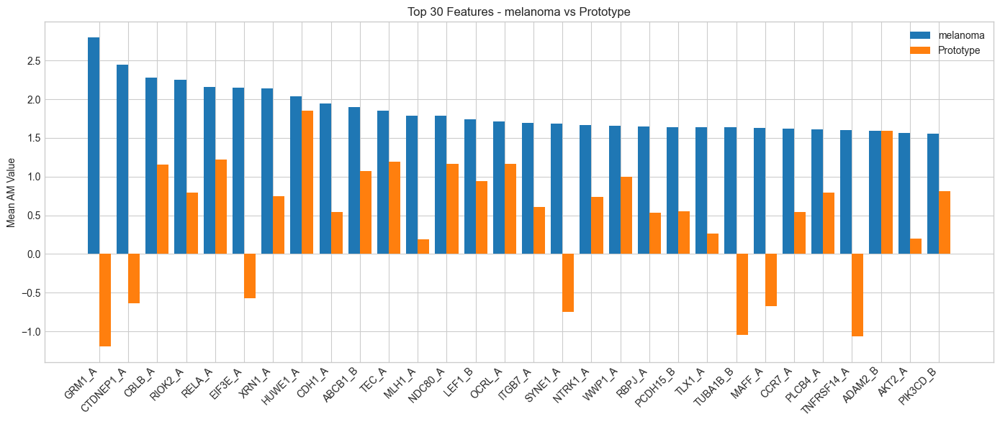

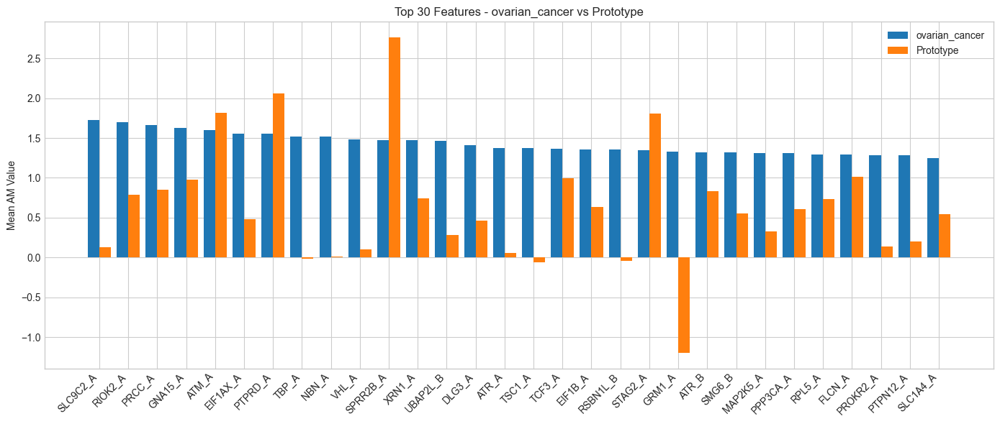

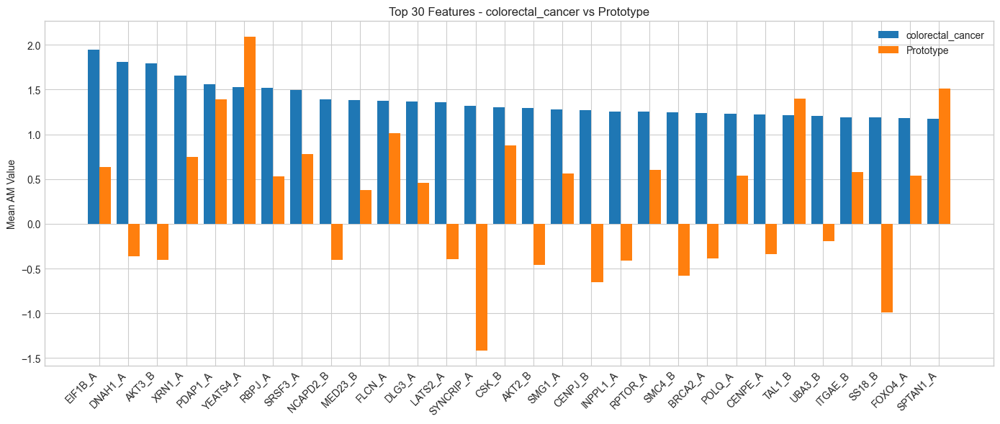

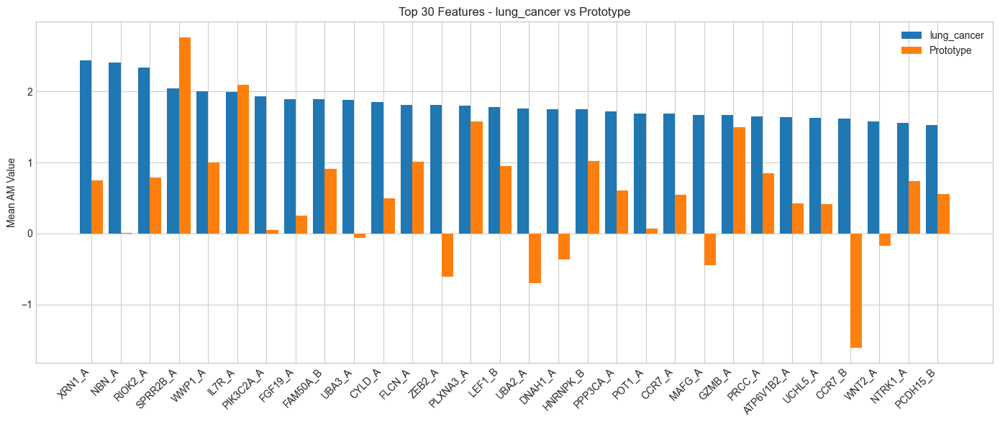

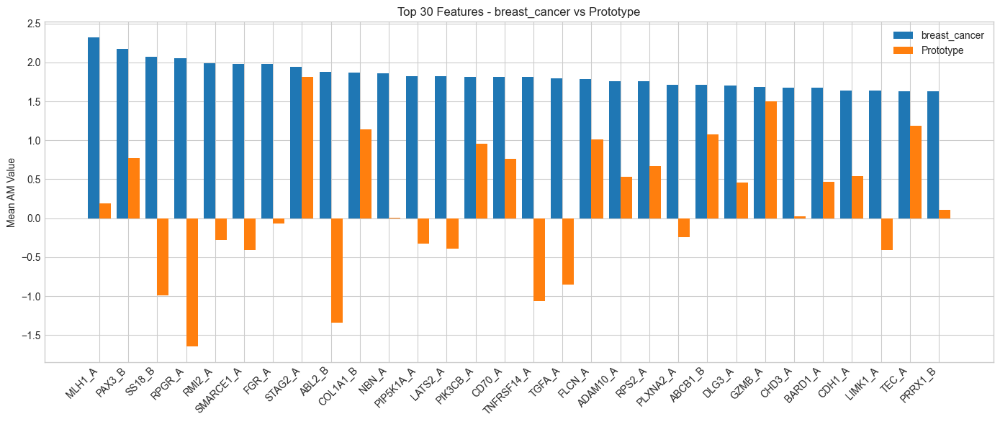

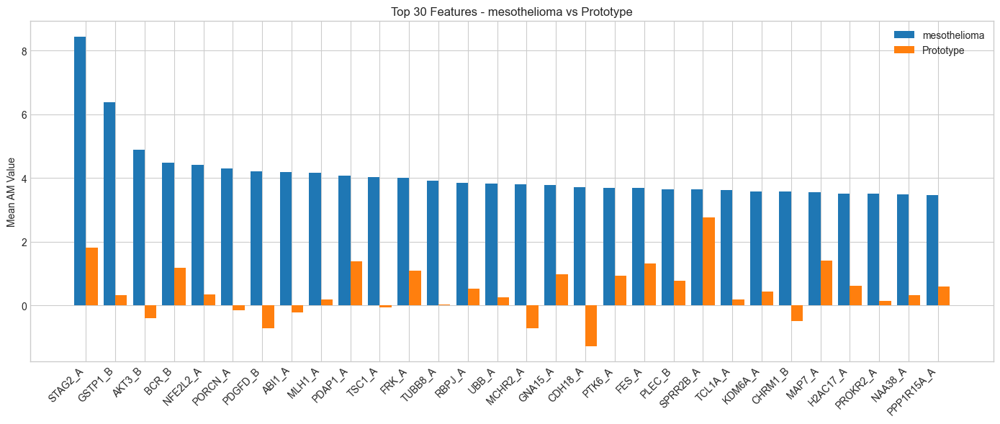

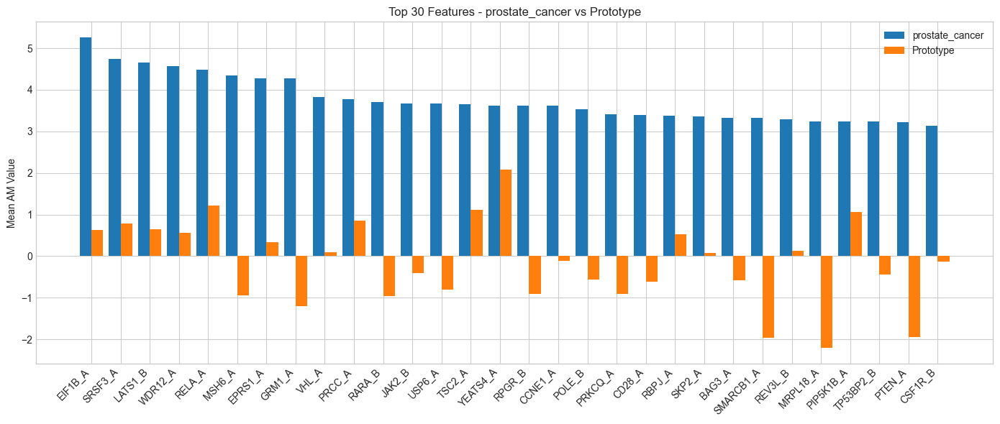

In [6]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from explaination_config import ExplainationConfig

plt.style.use("seaborn-v0_8-whitegrid")

clusters = {
    "melanoma": ["A375", "A2058", "HT144", "RPMI7951", "SKMEL30", "UACC62"],
    "ovarian_cancer": ["A2780", "CAOV3", "ES2", "OV90", "OVCAR3", "PA1", "SKOV3", "UWB1289"],
    "colorectal_cancer": ["DLD1", "HCT116", "HT29", "LOVO", "RKO", "SW620", "SW837"],
    "lung_cancer": ["A427", "NCIH23", "NCIH460", "NCIH520", "NCIH1650", "NCIH2122", "SKMES1"],
    "breast_cancer": ["MDAMB436", "T47D", "OCUBM", "KPL1", "ZR751"],
    "mesothelioma": ["MSTO"],
    "prostate_cancer": ["VCAP"],
    "prototype": ["prototypeAM"]
}

paper = "transynergy"
index_max = 4804
top_n = 30
feature_names = ExplainationConfig(paper=paper).feature_names

cell_lines = [cl for cls in clusters.values() for cl in cls]
feature_dim = len(feature_names)
am_data = {}

# Load feature importance for each cell line
for cl in cell_lines:
    if cl == "prototypeAM":
        path = f"explainability/am/results/{paper}_max_reg_l2_input"
    else:
        path = f"explainability/am/results/by_cell_line/{paper}_{cl}_max_reg_l2_input"

    imp = torch.zeros(feature_dim)
    if os.path.exists(path):
        for file in os.listdir(path):
            if file.endswith(".pt"):
                imp += torch.load(os.path.join(path, file))
        imp = imp.numpy()
    else:
        imp = np.zeros(feature_dim)

    # truncate or pad
    if len(imp) > index_max:
        imp = imp[:index_max]
    else:
        imp = np.pad(imp, (0, index_max - len(imp)), constant_values=0)

    am_data[cl] = imp

# Compute mean per cluster
cluster_means = {}
for cluster, cls in clusters.items():
    vecs = [am_data[cl] for cl in cls if cl in am_data]
    if vecs:
        cluster_means[cluster] = np.mean(np.stack(vecs), axis=0)

# Plot comparison with prototype
prototype_mean = cluster_means.get("prototype")
if prototype_mean is None:
    print("No prototype data found.")
else:
    for cluster, mean in cluster_means.items():
        if cluster == "prototype":
            continue

        sorted_idx = np.argsort(-mean)[:top_n]
        x = np.arange(top_n)

        plt.figure(figsize=(14, 6))
        plt.bar(x - 0.2, mean[sorted_idx], width=0.4, label=f"{cluster}")
        plt.bar(x + 0.2, prototype_mean[sorted_idx], width=0.4, label="Prototype")
        plt.xticks(x, [feature_names[i] for i in sorted_idx], rotation=45, ha='right')
        plt.ylabel("Mean AM Value")
        plt.title(f"Top {top_n} Features - {cluster} vs Prototype")
        plt.legend()
        plt.tight_layout()
        plt.show()


## Analysis of gene magnitudes by cell-line group

Some cell lines differ more from each other then the rest, therefore it can be usefull to conduct analysis of our AM results with respect to functional groups of the cacers they are associated with. We divide the cell lines from Transynergy into melanoma, colorectal cancer, lung cancer, breast cancer, prostate cancer and mesothelioma.

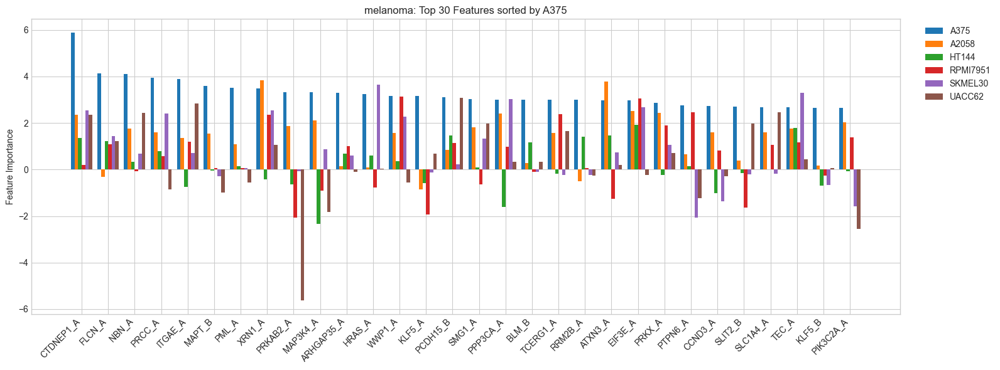

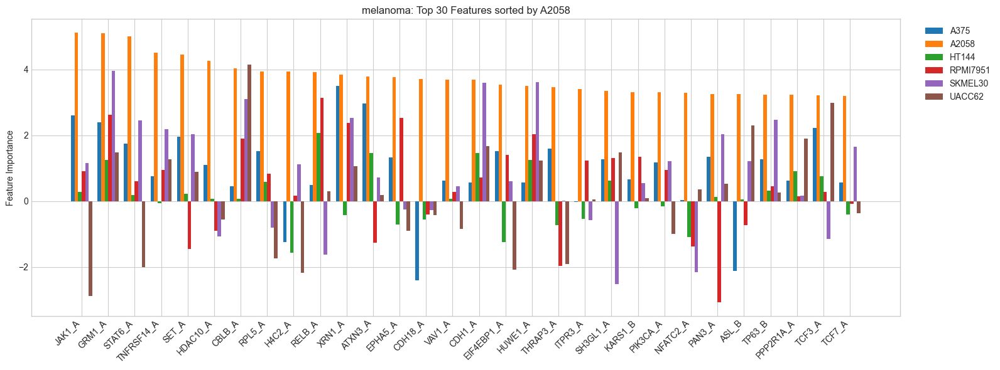

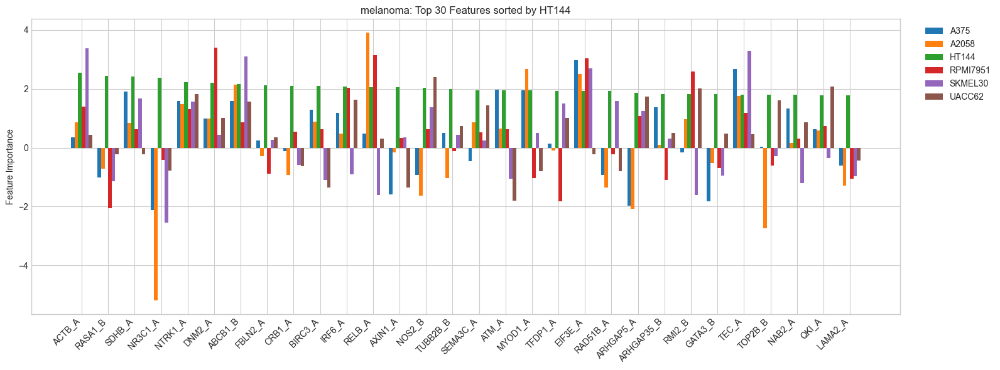

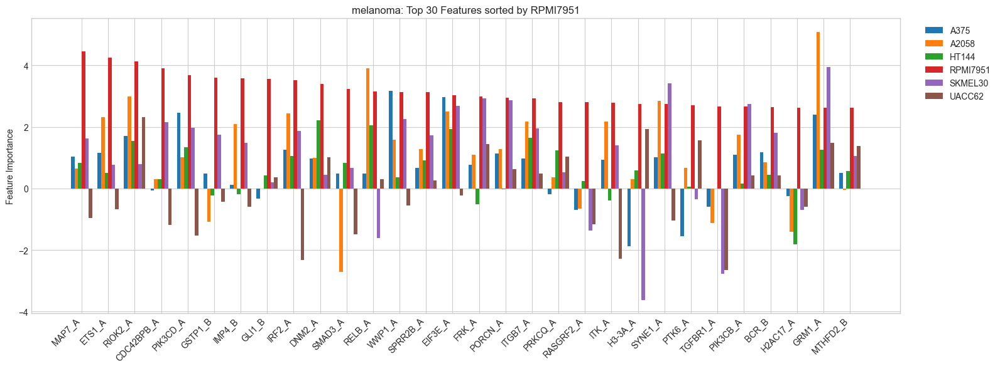

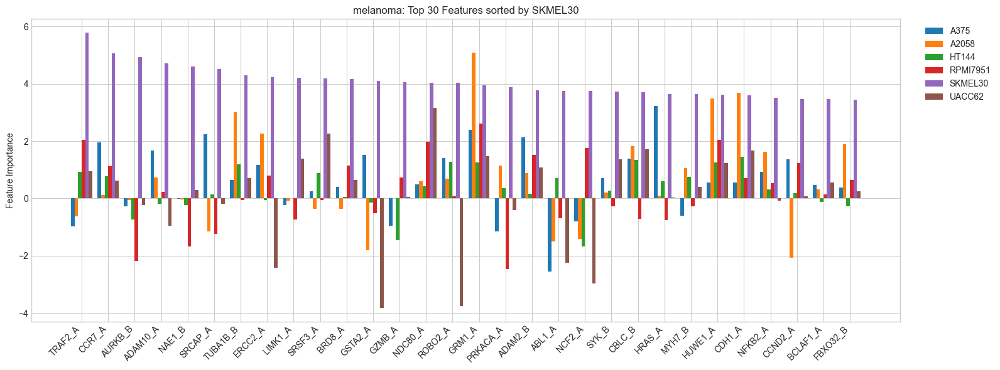

...

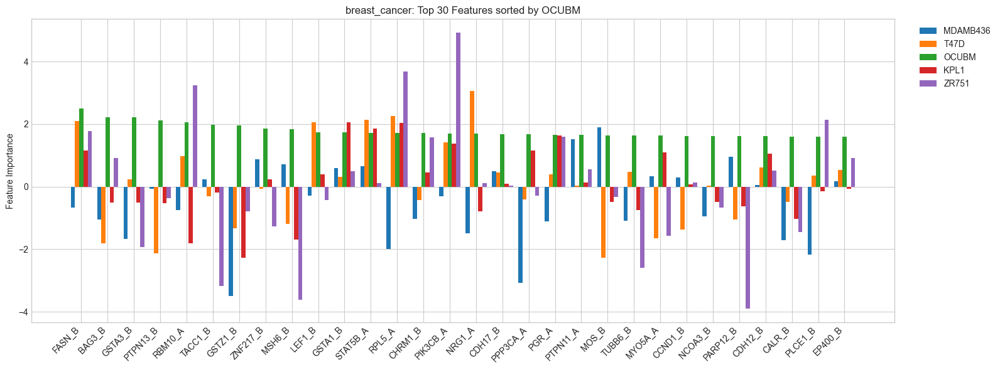

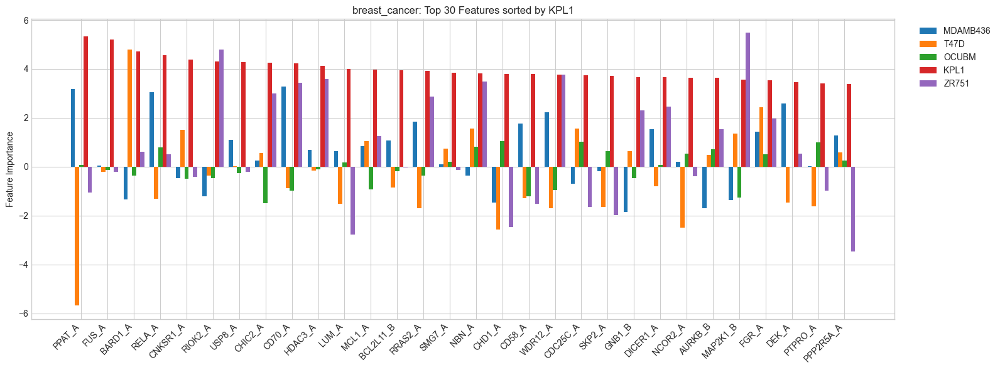

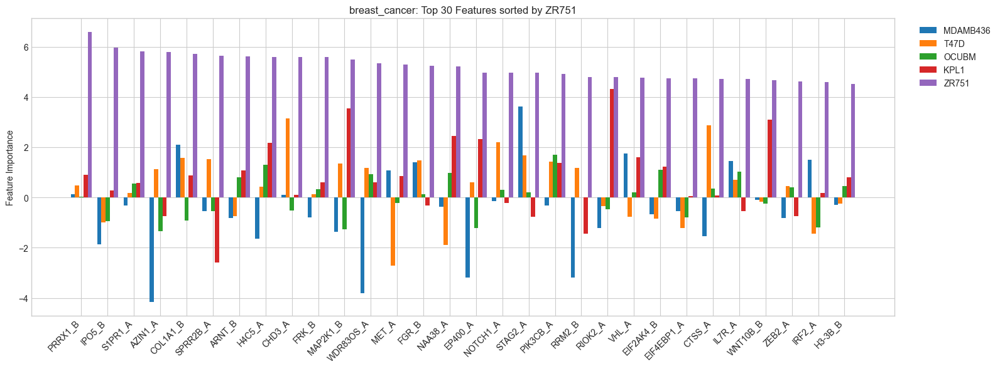

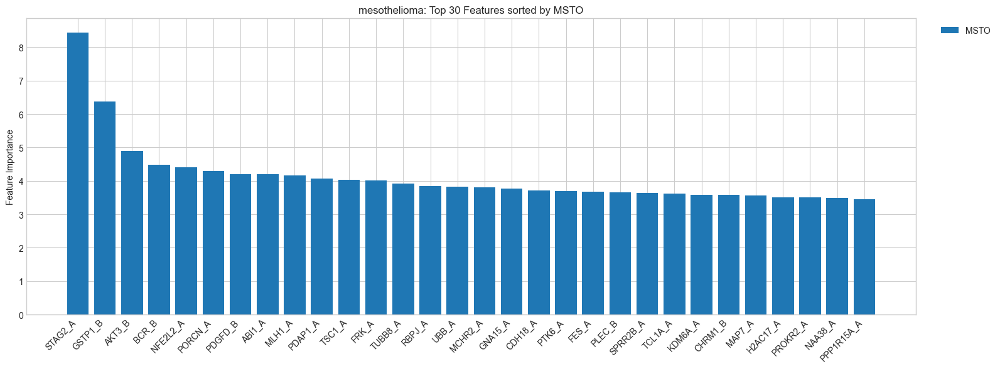

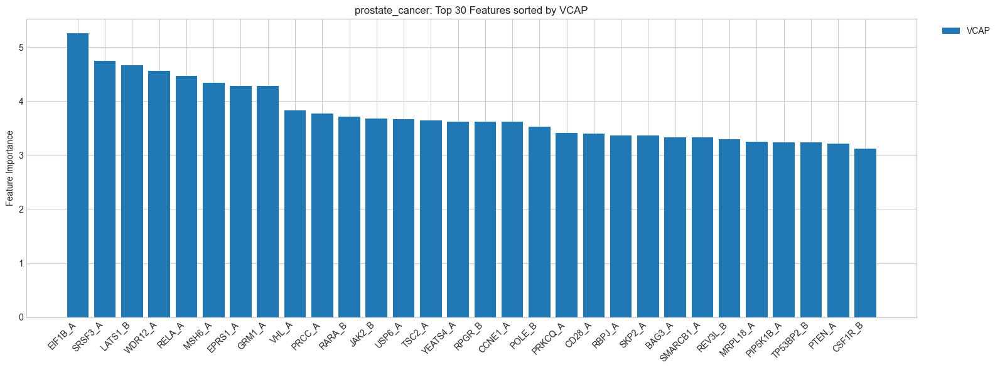

In [ ]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from explaination_config import ExplainationConfig

plt.style.use("seaborn-v0_8-whitegrid")

clusters = {
    "melanoma": ["A375", "A2058", "HT144", "RPMI7951", "SKMEL30", "UACC62"],
    "ovarian_cancer": ["A2780", "CAOV3", "ES2", "OV90", "OVCAR3", "PA1", "SKOV3", "UWB1289"],
    "colorectal_cancer": ["DLD1", "HCT116", "HT29", "LOVO", "RKO", "SW620", "SW837"],
    "lung_cancer": ["A427", "NCIH23", "NCIH460", "NCIH520", "NCIH1650", "NCIH2122", "SKMES1"],
    "breast_cancer": ["MDAMB436", "T47D", "OCUBM", "KPL1", "ZR751"],
    "mesothelioma": ["MSTO"],
    "prostate_cancer": ["VCAP"],
    "prototype": ["prototypeAM"]
}

paper = "transynergy"
index_max = 4804
top_n = 30
feature_names = ExplainationConfig(paper=paper).feature_names
feature_dim = len(feature_names)

# Load feature importance
am_data = {}
for cl in [cl for c in clusters.values() for cl in c]:
    if cl == "prototypeAM":
        path = f"explainability/am/results/{paper}_max_reg_l2_input"
    else:
        path = f"explainability/am/results/by_cell_line/{paper}_{cl}_max_reg_l2_input"

    importance = torch.zeros(feature_dim)
    if os.path.exists(path):
        for file in os.listdir(path):
            if file.endswith(".pt"):
                importance += torch.load(os.path.join(path, file))
        importance = importance.numpy()
    else:
        importance = np.zeros(feature_dim)

    if len(importance) > index_max:
        importance = importance[:index_max]
    else:
        importance = np.pad(importance, (0, index_max - len(importance)), constant_values=0)

    am_data[cl] = importance

# Per-cluster, per-cell-line plot
for cluster, cls in clusters.items():
    if cluster == "prototype":
        continue

    for ref_cl in cls:
        ref_imp = am_data[ref_cl]
        top_idx = np.argsort(-ref_imp)[:top_n]
        top_feat_names = [feature_names[i] for i in top_idx]

        x = np.arange(top_n)
        width = 0.8 / len(cls)

        plt.figure(figsize=(16, 6))
        for i, cl in enumerate(cls):
            imp = am_data[cl]
            vals = imp[top_idx]
            plt.bar(x + i * width, vals, width=width, label=cl)

        plt.xticks(x + width * (len(cls) - 1) / 2, top_feat_names, rotation=45, ha='right')
        plt.ylabel("Feature Importance")
        plt.title(f"{cluster}: Top {top_n} Features sorted by {ref_cl}")
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
        plt.tight_layout()
        plt.show()


## Case Anlaysis

What is particularly interesting in the AM results is the clear trend that emerges: when the magnitudes for a gene targeted by drug A are high, the optimal pairing—drug B—tends to show high magnitudes for a different set of targeted genes. This pattern is not simply a consequence of the applied regularization, as we observe a similar effect even without it. Rather, the models themselves learn that a synergistic drug pairing typically involves targeting distinct genes that contribute to the cancer. *Plots are taken from above*

---
### Biomining Cell line BT549
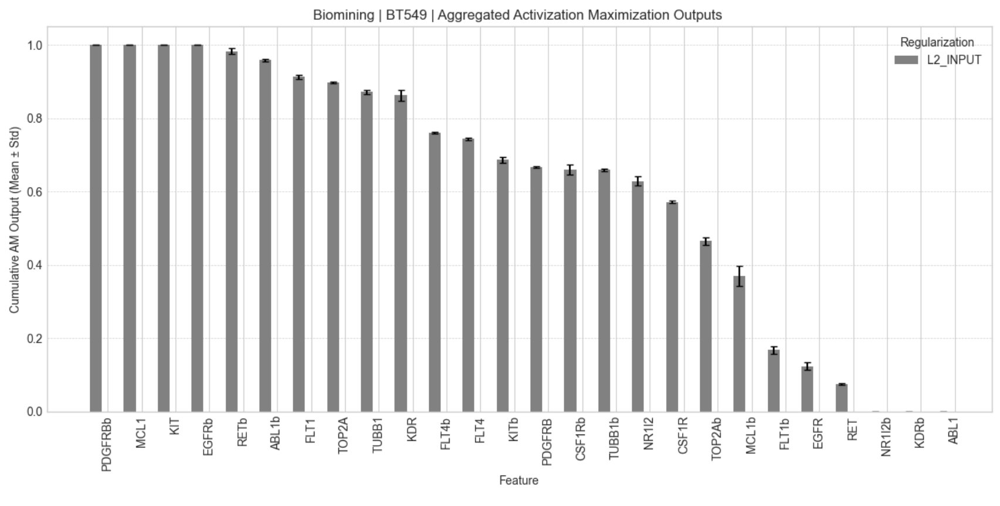

**What kinds of genes/proteins are being targeted by Drug A and Drug B?**
- PDGFRB8 : (Platelet‑Derived Growth Factor Receptor Beta) - associated with generally associated with tumor cell proliferation and migration.
- MCL1 (Myeloid Cell Leukaemia-1)  its main role is to prevent cell death
- KIT (Stem Cell Factor Receptor, c‑Kit) - receptor tyrosine kinase that plays a crucial role in cell signaling, especially for cell growth and survival.
- EGFR (Epidermal Growth Factor Receptor) - EGF to BT‑549 cells boosts the Akt pathway, not the NF‑κB pathway. This leads to increased release of chemokines like CXCL2

### Biomining Cell-line MCF7

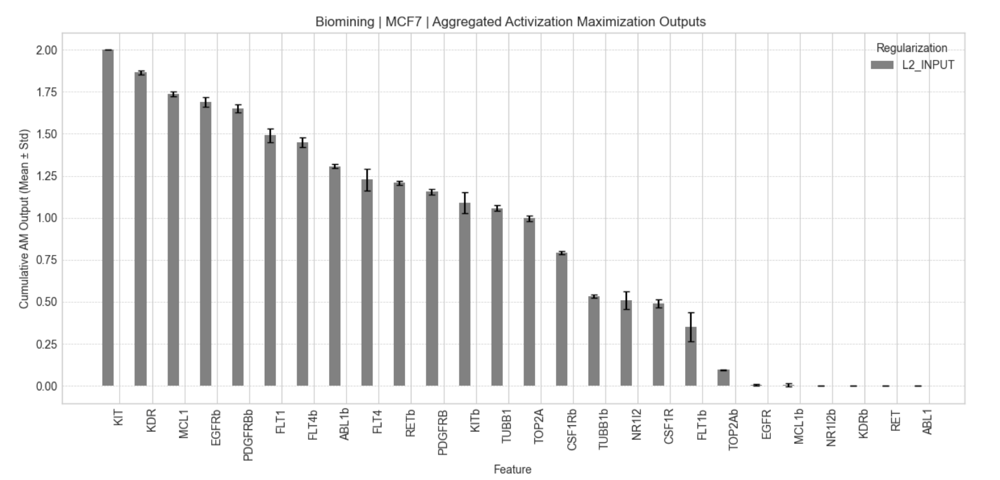

**What kinds of genes/proteins are being targeted by Drug A and Drug B?**

- KIT (1st and 10th-ish) receptor tyrosine kinase that plays a crucial role in cell signaling, especially for cell growth and survival.
- KDR (2nd and 3rd to last): KDR triggers key signaling pathways like PI3K/Akt and MAPK/ERK, promoting cell growth and survival (https://pubmed.ncbi.nlm.nih.gov/25182240/ - - - KDR-related treatment fights cancer in this cell line)
- MCL1 (3rd and 5th to last)  its main role is to prevent cell death
- EGFR (4th and 6th to last): responsible in the survival and proliferation pathway
- PDGFRB (5th and 10-ish): (Platelet‑Derived Growth Factor Receptor Beta) - associated with generally associated with tumor cell proliferation and migration.

---
### Transynergy Cell line CAOV3
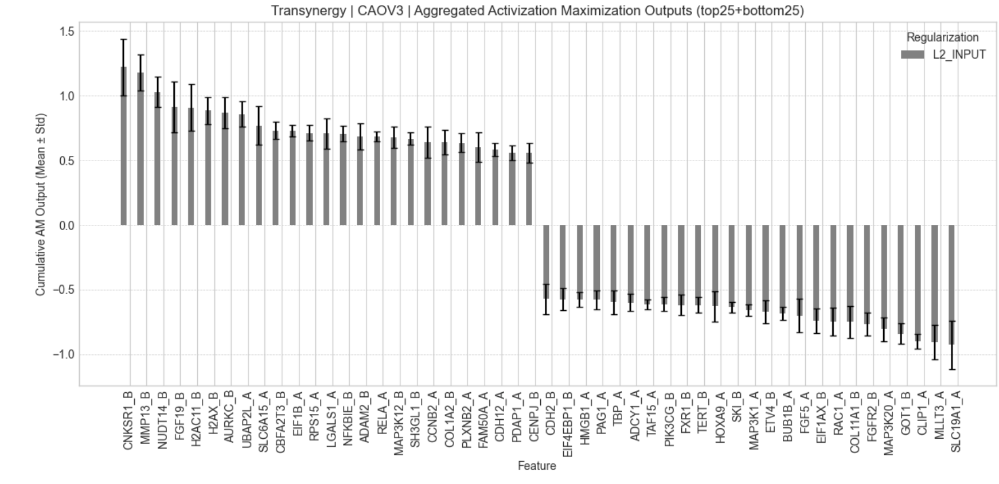


**What kinds of genes/proteins are being targeted by Drug A and Drug B?**

- CNKSR1: this particular gene probably supports proliferation and survival, helping cancer cells adapt if MEK is inhibited, diseases associated with it include Epilepsy and Autism Spectrum
- MMP12: MMP12 is highly expressed in most cancers and may serve as a novel biomarker for the prediction and prognosis of numerous cancers- but rather lung cancer https://pmc.ncbi.nlm.nih.gov/articles/PMC10898301/
- NUDT14: regulates metabolic balance in cells; often overexpressed in many cancers
- FGF19: promotes cell growth, survival, metabolism, and is frequently amplified in cancers

### Transynergy Cell line OCUBM
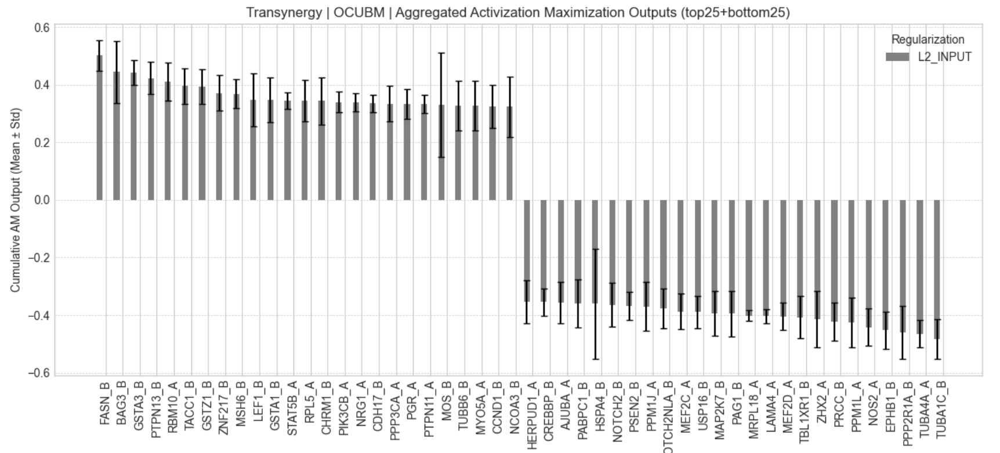
**What kinds of genes/proteins are being targeted by Drug A and Drug B?**

- FASN: Responsible for Fatty acid production (used for cell membrane)
- BAG3: Promotes survival: Preventing cell death (anti-apoptotic), Helping clean up damaged proteins (via autophagy), Maintaining the cell’s structure, Responding to physical stress (mechanotransduction)
- GSTA3: Helps resist chemo and oxidative damage
- PTPN13: Negative growth regulator


